### Kentang Model From Scratch

Input Images
- 224x224 pixel 

Output 
- Softmax (Vector)

Metrics
- Test loss: 0.15102235972881317 / Test accuracy: 0.9446808695793152
- Conf Matrix

![Conf matrix](https://i.imgur.com/5m9v1Mr.png)

In [1]:
import numpy as np
import pandas as pd
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
import time
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
import shutil
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Activation,Dropout,Conv2D, MaxPooling2D,BatchNormalization
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras import regularizers
from tensorflow.keras.models import Model
import time

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

In [2]:
tf.keras.backend.clear_session()

In [2]:
#%pip install tensorflow==2.9.1

import tensorflow as tf
print(tf. __version__)

2.12.0


In [5]:
# import shutil
# shutil.rmtree("/kaggle/working/aug")

In [3]:
#sdir=r'/kaggle/input/agronify-dataset/DiseasedPlants/Pertanian/Jagung'
sdir=r'/kaggle/input/agronify-dataset/DiseasedPlants/Perkebunan/Kentang'
min_samples=40 # set limit for minimum images a class must have to be included in the dataframe
filepaths = []
labels=[]
classlist=os.listdir(sdir)
for klass in classlist:
    classpath=os.path.join(sdir, klass)
    flist=os.listdir(classpath)
    if len(flist) >= min_samples:
        for f in flist:
            fpath=os.path.join(classpath,f)
            filepaths.append(fpath)
            labels.append(klass)
    else:
        print('class ', klass, ' has only', len(flist), ' samples and will not be included in dataframe')
Fseries=pd.Series(filepaths, name='filepaths')
Lseries=pd.Series(labels, name='labels')
df=pd.concat([Fseries, Lseries], axis=1)
train_df, dummy_df=train_test_split(df, train_size=.8, shuffle=True, random_state=123, stratify=df['labels'])
valid_df, test_df=train_test_split(dummy_df, train_size=.5, shuffle=True, random_state=123, stratify=dummy_df['labels'])
print('train_df lenght: ', len(train_df), '  test_df length: ', len(test_df), '  valid_df length: ', len(valid_df))
# get the number of classes and the images count for each class in train_df
classes=sorted(list(train_df['labels'].unique()))
class_count = len(classes)
print('The number of classes in the dataset is: ', class_count)
groups=train_df.groupby('labels')
print('{0:^30s} {1:^13s}'.format('CLASS', 'IMAGE COUNT'))
countlist=[]
classlist=[]
for label in sorted(list(train_df['labels'].unique())):
    group=groups.get_group(label)
    countlist.append(len(group))
    classlist.append(label)
    print('{0:^30s} {1:^13s}'.format(label, str(len(group))))

# get the classes with the minimum and maximum number of train images
max_value=np.max(countlist)
max_index=countlist.index(max_value)
max_class=classlist[max_index]
min_value=np.min(countlist)
min_index=countlist.index(min_value)
min_class=classlist[min_index]
print(max_class, ' has the most images= ',max_value, ' ', min_class, ' has the least images= ', min_value)
# lets get the average height and width of a sample of the train images
ht=0
wt=0
# select 100 random samples of train_df
train_df_sample=train_df.sample(n=100, random_state=123,axis=0)
for i in range (len(train_df_sample)):
    fpath=train_df_sample['filepaths'].iloc[i]
    img=plt.imread(fpath)
    shape=img.shape
    ht += shape[0]
    wt += shape[1]
print('average height= ', ht//100, ' average width= ', wt//100, 'aspect ratio= ', ht/wt)


train_df lenght:  1872   test_df length:  235   valid_df length:  234
The number of classes in the dataset is:  3
            CLASS               IMAGE COUNT 
     Potato__early_blight           876     
       Potato__healthy              122     
     Potato__late_blight            874     
Potato__early_blight  has the most images=  876   Potato__healthy  has the least images=  122
average height=  296  average width=  315 aspect ratio=  0.9382982094755189


In [4]:
def balance(df, n, working_dir, img_size):
    df=df.copy()
    print('Initial length of dataframe is ', len(df))
    aug_dir=os.path.join(working_dir, 'aug')# directory to store augmented images
    if os.path.isdir(aug_dir):# start with an empty directory
        shutil.rmtree(aug_dir)
    os.mkdir(aug_dir)
    for label in df['labels'].unique():
        dir_path=os.path.join(aug_dir,label)
        os.mkdir(dir_path) # make class directories within aug directory
    # create and store the augmented images
    total=0
    gen=ImageDataGenerator(
	  rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='reflect')
    groups=df.groupby('labels') # group by class
    for label in df['labels'].unique():  # for every class
        group=groups.get_group(label)  # a dataframe holding only rows with the specified label
        sample_count=len(group)   # determine how many samples there are in this class
        if sample_count< n: # if the class has less than target number of images
            aug_img_count=0
            delta=n - sample_count  # number of augmented images to create
            target_dir=os.path.join(aug_dir, label)  # define where to write the images
            msg='{0:40s} for class {1:^30s} creating {2:^5s} augmented images'.format(' ', label, str(delta))
            print(msg, '\r', end='') # prints over on the same line
            aug_gen=gen.flow_from_dataframe( group,  x_col='filepaths', y_col=None, target_size=img_size,
                                             class_mode=None, batch_size=1, shuffle=False,
                                             save_to_dir=target_dir, save_prefix='aug-', color_mode='rgb',
                                             save_format='jpg')
            while aug_img_count<delta:
                images=next(aug_gen)
                aug_img_count += len(images)
            total +=aug_img_count
    print('Total Augmented images created= ', total)
    # create aug_df and merge with train_df to create composite training set ndf
    aug_fpaths=[]
    aug_labels=[]
    classlist=os.listdir(aug_dir)
    for klass in classlist:
        classpath=os.path.join(aug_dir, klass)
        flist=os.listdir(classpath)
        for f in flist:
            fpath=os.path.join(classpath,f)
            aug_fpaths.append(fpath)
            aug_labels.append(klass)
    Fseries=pd.Series(aug_fpaths, name='filepaths')
    Lseries=pd.Series(aug_labels, name='labels')
    aug_df=pd.concat([Fseries, Lseries], axis=1)
    df=pd.concat([df,aug_df], axis=0).reset_index(drop=True)
    print('Length of augmented dataframe is now ', len(df))
    return df

n=1200 # number of samples in each class
working_dir=r'./' # directory to store augmented images
img_size=(200,200) # size of augmented images
train_df=balance(train_df, n, working_dir, img_size)

Initial length of dataframe is  1872
Found 874 validated image filenames.     for class      Potato__late_blight       creating  326  augmented images 
Found 876 validated image filenames.     for class      Potato__early_blight      creating  324  augmented images 
Found 122 validated image filenames.     for class        Potato__healthy         creating 1078  augmented images 
Total Augmented images created=  1728
Length of augmented dataframe is now  3600


In [5]:
batch_size=32 
trgen=ImageDataGenerator(
	  rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='reflect')
t_and_v_gen=ImageDataGenerator()
msg='{0:70s} for train generator'.format(' ')
print(msg, '\r', end='') # prints over on the same line
train_gen=trgen.flow_from_dataframe(train_df, x_col='filepaths', y_col='labels', target_size=img_size,
                                    class_mode='categorical', color_mode='rgb', shuffle=True, batch_size=batch_size)
msg='{0:70s} for valid generator'.format(' ')
print(msg, '\r', end='') # prints over on the same line
valid_gen=t_and_v_gen.flow_from_dataframe(valid_df, x_col='filepaths', y_col='labels', target_size=img_size,
                                          class_mode='categorical', color_mode='rgb', shuffle=False, batch_size=batch_size)
# for the test_gen we want to calculate the batch size and test steps such that batch_size X test_steps= number of samples in test set
# this insures that we go through all the sample in the test set exactly once.
length=len(test_df)
test_batch_size=sorted([int(length/n) for n in range(1,length+1) if length % n ==0 and length/n<=80],reverse=True)[0]
test_steps=int(length/test_batch_size)
msg='{0:70s} for test generator'.format(' ')
print(msg, '\r', end='') # prints over on the same line
test_gen=t_and_v_gen.flow_from_dataframe(test_df, x_col='filepaths', y_col='labels', target_size=img_size,
                                         class_mode='categorical', color_mode='rgb', shuffle=False, batch_size=test_batch_size)
# from the generator we can get information we will need later
classes=list(train_gen.class_indices.keys())
class_indices=list(train_gen.class_indices.values())
class_count=len(classes)
labels=test_gen.labels
print ( 'test batch size: ' ,test_batch_size, '  test steps: ', test_steps, ' number of classes : ', class_count)

Found 3600 validated image filenames belonging to 3 classes.           for train generator 
Found 234 validated image filenames belonging to 3 classes.            for valid generator 
Found 235 validated image filenames belonging to 3 classes.            for test generator 
test batch size:  47   test steps:  5  number of classes :  3


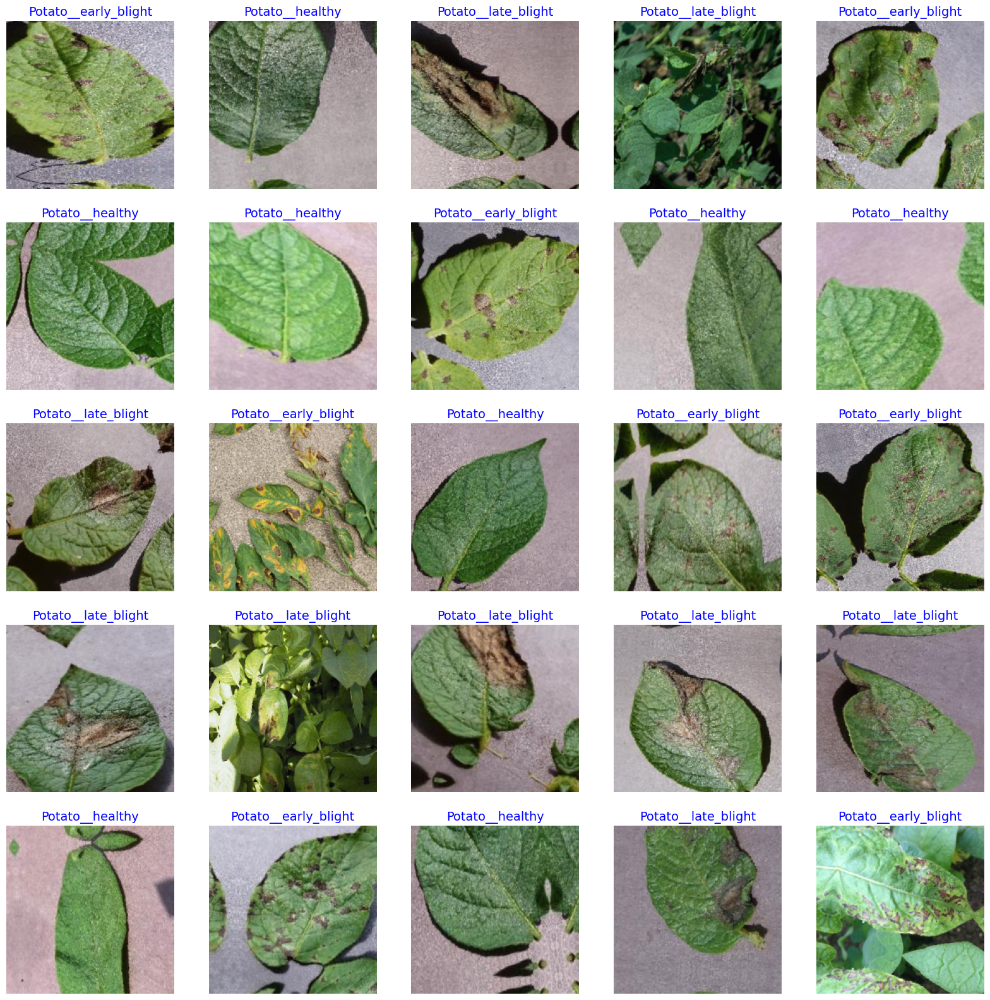

In [6]:
def show_image_samples(gen ):
    t_dict=gen.class_indices
    classes=list(t_dict.keys())
    images,labels=next(gen) # get a sample batch from the generator
    plt.figure(figsize=(20, 20))
    length=len(labels)
    if length<25:   #show maximum of 25 images
        r=length
    else:
        r=25
    for i in range(r):
        plt.subplot(5, 5, i + 1)
        image=images[i] /255
        plt.imshow(image)
        index=np.argmax(labels[i])
        class_name=classes[index]
        plt.title(class_name, color='blue', fontsize=14)
        plt.axis('off')
    plt.show()

show_image_samples(train_gen)

In [17]:
tf.keras.backend.clear_session()

In [10]:
lr=.001
model = tf.keras.models.Sequential([
    # Note the input shape is the desired size of the image 150x150 with 3 bytes color
    # This is the first convolution
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(224, 224, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    # The second convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The third convolution
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The fourth convolution
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # Flatten the results to feed into a DNN
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.3),
    # 512 neuron hidden layer
    tf.keras.layers.Dense(248, activation='relu'),
    tf.keras.layers.Dense(3, activation='softmax')
])
model.summary()
model.compile(Adamax(learning_rate=lr), 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 111, 111, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 54, 54, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 52, 52, 64)        36928     
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 26, 26, 64)      

In [11]:
class LR_ASK(keras.callbacks.Callback):
    def __init__ (self, model, epochs,  ask_epoch): # initialization of the callback
        super(LR_ASK, self).__init__()
        self.model=model
        self.ask_epoch=ask_epoch
        self.epochs=epochs
        self.ask=True # if True query the user on a specified epoch
        self.lowest_vloss=np.inf
        self.best_weights=self.model.get_weights() # set best weights to model's initial weights
        self.best_epoch=1


    def on_train_begin(self, logs=None): # this runs on the beginning of training
        if self.ask_epoch == 0:
            print('you set ask_epoch = 0, ask_epoch will be set to 1', flush=True)
            self.ask_epoch=1
        if self.ask_epoch >= self.epochs: # you are running for epochs but ask_epoch>epochs
            print('ask_epoch >= epochs, will train for ', epochs, ' epochs', flush=True)
            self.ask=False # do not query the user
        if self.epochs == 1:
            self.ask=False # running only for 1 epoch so do not query user
        else:
            print('Training will proceed until epoch', ask_epoch,' then you will be asked to')
            print(' enter H to halt training or enter an integer for how many more epochs to run then be asked again')
        self.start_time= time.time() # set the time at which training started

    def on_train_end(self, logs=None):   # runs at the end of training
        print('loading model with weights from epoch ', self.best_epoch)
        self.model.set_weights(self.best_weights) # set the weights of the model to the best weights
        tr_duration=time.time() - self.start_time   # determine how long the training cycle lasted
        hours = tr_duration // 3600
        minutes = (tr_duration - (hours * 3600)) // 60
        seconds = tr_duration - ((hours * 3600) + (minutes * 60))
        msg = f'training elapsed time was {str(hours)} hours, {minutes:4.1f} minutes, {seconds:4.2f} seconds)'
        print (msg, flush=True) # print out training duration time

    def on_epoch_end(self, epoch, logs=None):  # method runs on the end of each epoch
        v_loss=logs.get('val_loss')  # get the validation loss for this epoch
        if v_loss< self.lowest_vloss:
            self.lowest_vloss=v_loss
            self.best_weights=self.model.get_weights() # set best weights to model's initial weights
            self.best_epoch=epoch + 1
            print (f'\n validation loss of {v_loss:7.4f} is below lowest loss, saving weights from epoch {str(epoch + 1):3s} as best weights')
        else:
            print (f'\n validation loss of {v_loss:7.4f} is above lowest loss of {self.lowest_vloss:7.4f} keeping weights from epoch {str(self.best_epoch)} as best weights')

        if self.ask: # are the conditions right to query the user?
            if epoch + 1 ==self.ask_epoch: # is this epoch the one for quering the user?
                print('\n Enter H to end training or  an integer for the number of additional epochs to run then ask again')
                ans=input()

                if ans == 'H' or ans =='h' or ans == '0': # quit training for these conditions
                    print ('you entered ', ans, ' Training halted on epoch ', epoch+1, ' due to user input\n', flush=True)
                    self.model.stop_training = True # halt training
                else: # user wants to continue training
                    self.ask_epoch += int(ans)
                    if self.ask_epoch > self.epochs:
                        print('\nYou specified maximum epochs of as ', self.epochs, ' cannot train for ', self.ask_epoch, flush =True)
                    else:
                        print ('you entered ', ans, ' Training will continue to epoch ', self.ask_epoch, flush=True)
                        lr=float(tf.keras.backend.get_value(self.model.optimizer.lr)) # get the current learning rate
                        print(f'current LR is  {lr:7.5f}  hit enter to keep  this LR or enter a new LR')
                        ans=input(' ')
                        if ans =='':
                            print (f'keeping current LR of {lr:7.5f}')
                        else:
                            new_lr=float(ans)
                            tf.keras.backend.set_value(self.model.optimizer.lr, new_lr) # set the learning rate in the optimizer
                            print(' changing LR to ', ans)

epochs=50
ask_epoch=5
ask=LR_ASK(model, epochs,  ask_epoch)
rlronp=tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2,verbose=1)
callbacks=[rlronp, ask]
#callbacks=[ask]

history=model.fit(x=train_gen,  
                  epochs=epochs, 
                  verbose=1, 
                  callbacks=callbacks,  
                  validation_data=valid_gen,
                  validation_steps=None,  
                  shuffle=False,  
                  initial_epoch=0)



Training will proceed until epoch 5  then you will be asked to
 enter H to halt training or enter an integer for how many more epochs to run then be asked again
Epoch 1/50
113/113 [==============================] - ETA: 0s - loss: 0.9391 - accuracy: 0.6072
 validation loss of  0.6244 is below lowest loss, saving weights from epoch 1   as best weights
113/113 [==============================] - 53s 383ms/step - loss: 0.9391 - accuracy: 0.6072 - val_loss: 0.6244 - val_accuracy: 0.6752 - lr: 0.0010
Epoch 2/50
113/113 [==============================] - ETA: 0s - loss: 0.5365 - accuracy: 0.7714
 validation loss of  0.3438 is below lowest loss, saving weights from epoch 2   as best weights
113/113 [==============================] - 39s 341ms/step - loss: 0.5365 - accuracy: 0.7714 - val_loss: 0.3438 - val_accuracy: 0.8803 - lr: 0.0010
Epoch 3/50
113/113 [==============================] - ETA: 0s - loss: 0.3459 - accuracy: 0.8731
 validation loss of  0.5830 is above lowest loss of  0.3438 keepi

 10


you entered  10  Training will continue to epoch  15
current LR is  0.00100  hit enter to keep  this LR or enter a new LR


keeping current LR of 0.00100
113/113 [==============================] - 57s 505ms/step - loss: 0.2554 - accuracy: 0.9033 - val_loss: 0.2476 - val_accuracy: 0.9103 - lr: 0.0010
Epoch 6/50
113/113 [==============================] - ETA: 0s - loss: 0.2421 - accuracy: 0.9153
 validation loss of  0.2697 is above lowest loss of  0.2476 keeping weights from epoch 5 as best weights
113/113 [==============================] - 37s 324ms/step - loss: 0.2421 - accuracy: 0.9153 - val_loss: 0.2697 - val_accuracy: 0.9188 - lr: 0.0010
Epoch 7/50
113/113 [==============================] - ETA: 0s - loss: 0.2451 - accuracy: 0.9100
 validation loss of  0.2127 is below lowest loss, saving weights from epoch 7   as best weights
113/113 [==============================] - 37s 330ms/step - loss: 0.2451 - accuracy: 0.9100 - val_loss: 0.2127 - val_accuracy: 0.9359 - lr: 0.0010
Epoch 8/50
113/113 [==============================] - ETA: 0s - loss: 0.2178 - accuracy: 0.9217
 validation loss of  0.1779 is below low

 5


you entered  5  Training will continue to epoch  20
current LR is  0.00025  hit enter to keep  this LR or enter a new LR


keeping current LR of 0.00025
113/113 [==============================] - 44s 389ms/step - loss: 0.1366 - accuracy: 0.9514 - val_loss: 0.1675 - val_accuracy: 0.9274 - lr: 2.5000e-04
Epoch 16/50
113/113 [==============================] - ETA: 0s - loss: 0.1219 - accuracy: 0.9550
Epoch 16: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.

 validation loss of  0.1401 is above lowest loss of  0.1232 keeping weights from epoch 12 as best weights
113/113 [==============================] - 37s 326ms/step - loss: 0.1219 - accuracy: 0.9550 - val_loss: 0.1401 - val_accuracy: 0.9573 - lr: 2.5000e-04
Epoch 17/50
113/113 [==============================] - ETA: 0s - loss: 0.1101 - accuracy: 0.9558
 validation loss of  0.1311 is above lowest loss of  0.1232 keeping weights from epoch 12 as best weights
113/113 [==============================] - 37s 330ms/step - loss: 0.1101 - accuracy: 0.9558 - val_loss: 0.1311 - val_accuracy: 0.9573 - lr: 1.2500e-04
Epoch 18/50
113/113 [============

 10


you entered  10  Training will continue to epoch  30
current LR is  0.00013  hit enter to keep  this LR or enter a new LR


keeping current LR of 0.00013
113/113 [==============================] - 48s 425ms/step - loss: 0.1131 - accuracy: 0.9567 - val_loss: 0.1153 - val_accuracy: 0.9615 - lr: 1.2500e-04
Epoch 21/50
113/113 [==============================] - ETA: 0s - loss: 0.1019 - accuracy: 0.9592
 validation loss of  0.1150 is below lowest loss, saving weights from epoch 21  as best weights
113/113 [==============================] - 37s 324ms/step - loss: 0.1019 - accuracy: 0.9592 - val_loss: 0.1150 - val_accuracy: 0.9487 - lr: 1.2500e-04
Epoch 22/50
113/113 [==============================] - ETA: 0s - loss: 0.0966 - accuracy: 0.9631
 validation loss of  0.1273 is above lowest loss of  0.1150 keeping weights from epoch 21 as best weights
113/113 [==============================] - 37s 326ms/step - loss: 0.0966 - accuracy: 0.9631 - val_loss: 0.1273 - val_accuracy: 0.9487 - lr: 1.2500e-04
Epoch 23/50
113/113 [==============================] - ETA: 0s - loss: 0.1093 - accuracy: 0.9572
Epoch 23: ReduceLROnPlat

 10


you entered  10  Training will continue to epoch  40
current LR is  0.00001  hit enter to keep  this LR or enter a new LR


keeping current LR of 0.00001
113/113 [==============================] - 69s 614ms/step - loss: 0.0879 - accuracy: 0.9642 - val_loss: 0.1330 - val_accuracy: 0.9573 - lr: 7.8125e-06
Epoch 31/50
113/113 [==============================] - ETA: 0s - loss: 0.0885 - accuracy: 0.9636
Epoch 31: ReduceLROnPlateau reducing learning rate to 3.906250185536919e-06.

 validation loss of  0.1275 is above lowest loss of  0.1150 keeping weights from epoch 21 as best weights
113/113 [==============================] - 38s 332ms/step - loss: 0.0885 - accuracy: 0.9636 - val_loss: 0.1275 - val_accuracy: 0.9573 - lr: 7.8125e-06
Epoch 32/50
113/113 [==============================] - ETA: 0s - loss: 0.0980 - accuracy: 0.9594
 validation loss of  0.1312 is above lowest loss of  0.1150 keeping weights from epoch 21 as best weights
113/113 [==============================] - 37s 324ms/step - loss: 0.0980 - accuracy: 0.9594 - val_loss: 0.1312 - val_accuracy: 0.9573 - lr: 3.9063e-06
Epoch 33/50
113/113 [============

 H


you entered  H  Training halted on epoch  40  due to user input

113/113 [==============================] - 40s 351ms/step - loss: 0.0974 - accuracy: 0.9628 - val_loss: 0.1282 - val_accuracy: 0.9573 - lr: 2.4414e-07
loading model with weights from epoch  21
training elapsed time was 0.0 hours, 28.0 minutes, 46.47 seconds)


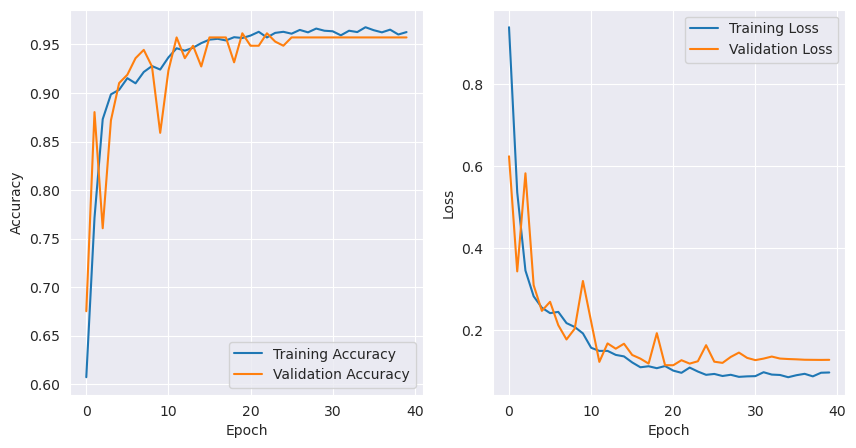

In [12]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

5/5 [==============================] - 2s 398ms/step
there were 13 errors in 235 tests for an accuracy of  94.47


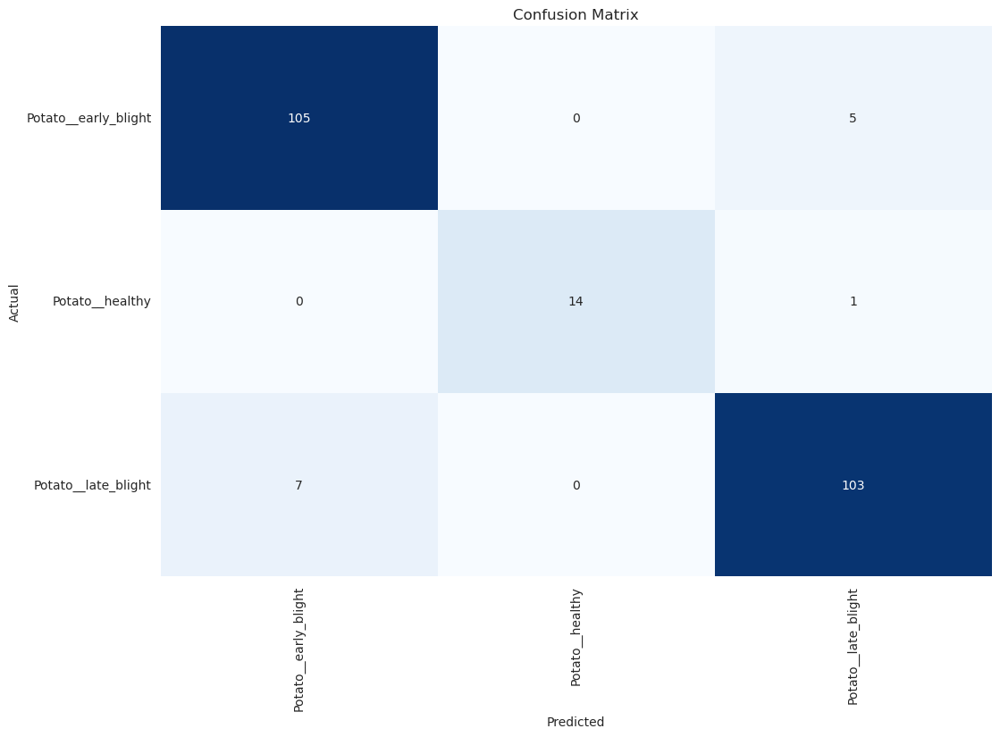

Classification Report:
----------------------
                       precision    recall  f1-score   support

Potato__early_blight     0.9375    0.9545    0.9459       110
     Potato__healthy     1.0000    0.9333    0.9655        15
 Potato__late_blight     0.9450    0.9364    0.9406       110

            accuracy                         0.9447       235
           macro avg     0.9608    0.9414    0.9507       235
        weighted avg     0.9450    0.9447    0.9447       235



In [13]:
def predictor(test_gen, test_steps):
    y_pred= []
    y_true=test_gen.labels
    classes=list(test_gen.class_indices.keys())
    class_count=len(classes)
    errors=0
    preds=model.predict(test_gen, verbose=1)
    tests=len(preds)
    for i, p in enumerate(preds):
        pred_index=np.argmax(p)
        true_index=test_gen.labels[i]  # labels are integer values
        if pred_index != true_index: # a misclassification has occurred
            errors=errors + 1
        y_pred.append(pred_index)

    acc=( 1-errors/tests) * 100
    print(f'there were {errors} errors in {tests} tests for an accuracy of {acc:6.2f}')
    ypred=np.array(y_pred)
    ytrue=np.array(y_true)
    if class_count <=30:
        cm = confusion_matrix(ytrue, ypred )
        # plot the confusion matrix
        plt.figure(figsize=(12, 8))
        sns.heatmap(cm, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)
        plt.xticks(np.arange(class_count)+.5, classes, rotation=90)
        plt.yticks(np.arange(class_count)+.5, classes, rotation=0)
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title("Confusion Matrix")
        plt.show()
    clr = classification_report(y_true, y_pred, target_names=classes, digits= 4) # create classification report
    print("Classification Report:\n----------------------\n", clr)
    return errors, tests
errors, tests=predictor(test_gen, test_steps)

In [14]:
#predictions = model.predict(test_gen)
predictions = model.predict(test_gen, steps=test_steps, verbose=1)

predicted_classes = np.argmax(predictions, axis=1)
true_classes = test_gen.classes
class_labels = list(test_gen.class_indices.keys())

from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(true_classes, predicted_classes, target_names=class_labels))
print(confusion_matrix(true_classes, predicted_classes))

5/5 [==============================] - 1s 121ms/step
                      precision    recall  f1-score   support

Potato__early_blight       0.94      0.95      0.95       110
     Potato__healthy       1.00      0.93      0.97        15
 Potato__late_blight       0.94      0.94      0.94       110

            accuracy                           0.94       235
           macro avg       0.96      0.94      0.95       235
        weighted avg       0.94      0.94      0.94       235

[[105   0   5]
 [  0  14   1]
 [  7   0 103]]


1/1 [==============================] - 0s 27ms/step


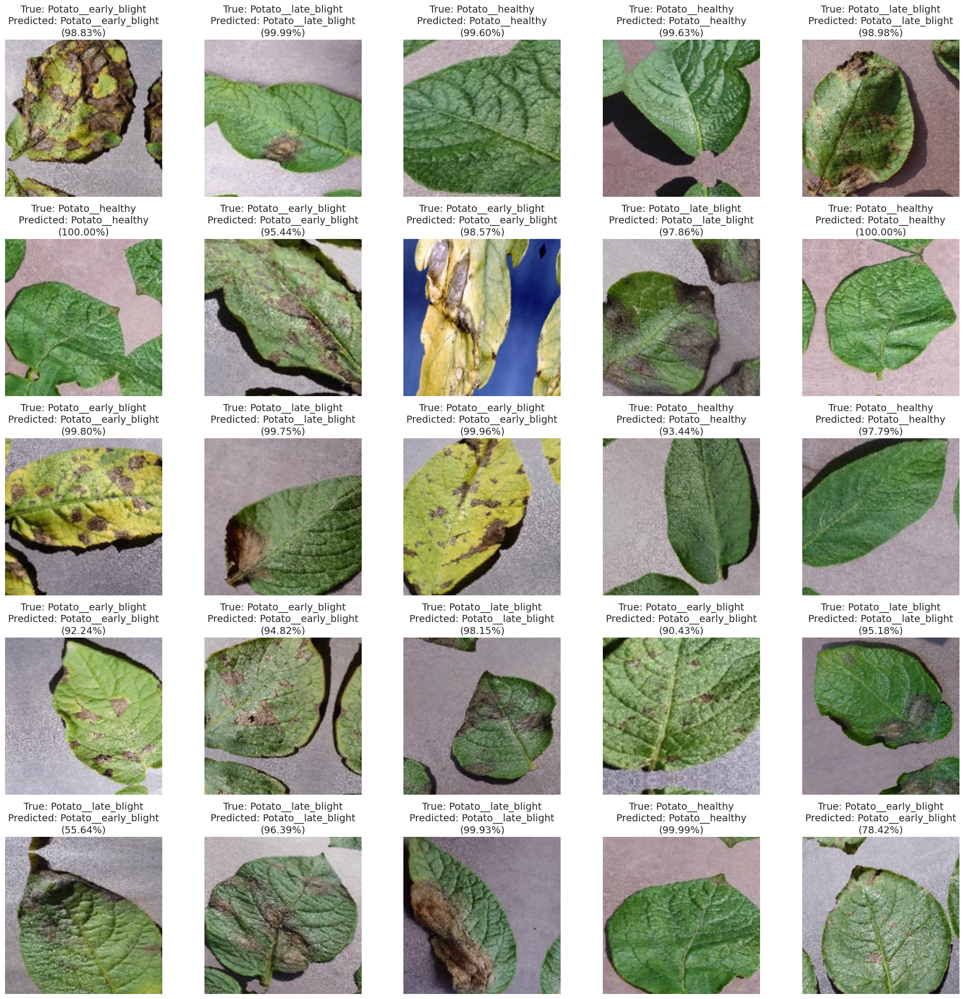

In [23]:
import tensorflow as tf

def show_image_samples(gen, model):
    t_dict = gen.class_indices
    classes = list(t_dict.keys())
    images, labels = next(gen)  # get a sample batch from the generator
    
    # Resize images to the expected input shape
    resized_images = tf.image.resize(images, (224, 224))
    
    predictions = model.predict(resized_images)
    predicted_labels = [classes[np.argmax(pred)] for pred in predictions]
    predicted_probs = np.max(predictions, axis=1)

    plt.figure(figsize=(20, 20))
    length = len(labels)
    if length < 25:  # show maximum of 25 images
        r = length
    else:
        r = 25
    for i in range(r):
        plt.subplot(5, 5, i + 1)
        image = images[i] / 255
        plt.imshow(image)
        true_label_index = np.argmax(labels[i])
        true_class_name = classes[true_label_index]
        predicted_class_name = predicted_labels[i]
        predicted_prob = predicted_probs[i]
        plt.title(f"True: {true_class_name}\nPredicted: {predicted_class_name}\n({predicted_prob:.2%})", fontsize=14)
        plt.axis('off')
    
    plt.tight_layout()  # Menyesuaikan layout subplot
    plt.show()

# Contoh penggunaan
show_image_samples(train_gen, model)


In [20]:
score = model.evaluate(test_gen, verbose=1)
print(f'Test loss: {score[0]} / Test accuracy: {score[1]}')

5/5 [==============================] - 1s 133ms/step - loss: 0.1510 - accuracy: 0.9447
Test loss: 0.15102235972881317 / Test accuracy: 0.9446808695793152


In [18]:
model.save('KentangV6.h5')

In [25]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 111, 111, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 54, 54, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 52, 52, 64)        36928     
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 26, 26, 64)      

1/1 [==============================] - 0s 41ms/step
This image most likely belongs to Potato__early_blight with a 49.89% confidence.


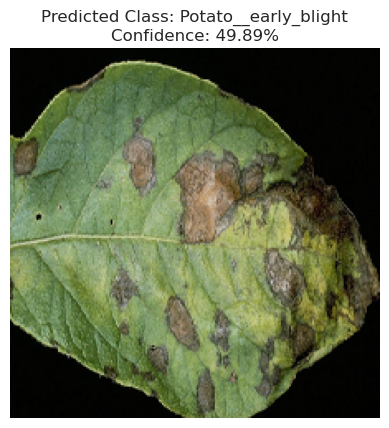

In [40]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

Potato__early_blight = "https://cropscience.bayer.co.uk/media/103035203/early-blight.png?preset=384_x_230"
Potato__early_blight = tf.keras.utils.get_file('Potato__early_blight', origin=Potato__early_blight)

t_dict = train_gen.class_indices
classes = list(t_dict.keys())

img = tf.keras.utils.load_img(Potato__early_blight, target_size=(224, 224))
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)  # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

predicted_class = classes[np.argmax(score)]
confidence = 100 * np.max(score)

print(
    "This image most likely belongs to {} with a {:.2f}% confidence."
    .format(predicted_class, confidence)
)

# Display the image
plt.imshow(img)
plt.title("Predicted Class: {}\nConfidence: {:.2f}%".format(predicted_class, confidence))
plt.axis("off")
plt.show()
